In [1]:
"""
Plotting for the NPD_eORCA025 wind-perturbation attribution experiments (ANWSUP,ANWTRN and WNDREP 
experiments), their control equivalents, the climatological baselines (BASELINE_NPD 1996-2023; 
BASELINE_HG3 1976-2005) and HG3-1995.

Note: The notebook follows the section format of the manuscript, in the same chronological order. 
The markdown headers below are written to be similar to the manuscript's own section headings (the
numbering is the same) and the figures follow under them in the order they appear there.

Processing in this script includes:
-------------------------------------
1. Section 2.2: Figure 1, longitude-time Hovmollers of zonal wind (uas) over the equatorial Pacific
(10S-10N, 115E-285E) for the control, baseline and perturbed forcing fields, along with the
isolated anomalous westerlies (anomalies >= mean + 1 standard deviation); and Figure 2,
climatological mean winds of JRA55-do and BASELINE_HG3 along with the correction factors used in
WNDREP-HG3c.

2. Sections 3.1-3.3, one per experiment group (ANWSUP, ANWTRN, WNDREP), each with the same pair of
figures: SST anomaly maps, upper-300m ocean heat content anomaly maps and equatorial
depth-longitude cross-sections of ocean temperature anomalies (Figures 3, 5, 7); and the cumulative
Nino 3.4 heat content anomaly per depth layer, the zonal vs. vertical advective heat trajectories
relative to climatology, and the depth of the 20 C isotherm (Z20) with its anomaly (Figures 4, 6, 8).

3. Figures for the Supporting Information: ONI time series of the NPD control run against ORAS5,
EN4 and NOAA PSL ONI v2 (S1), ENSO cycle (that was used to pick HG3-1995) of HadGEM3-GC31-HH 
control-1950 compared with observed ones (S2), a map of the Nino monitoring regions (S3), 
and depth-time Nino 3.4 temperature anomalies for every run (S4).

Note: Figures 3-8 are each drawn as separate panels (A, B, C), saved as individual PNGs and merged
into the final manuscript figure; the plotting is done using pre-defined functions that are configured
to be reused (hence, saving up on space). These functions are defined in utils.py.

-------------------------------------------------------------------------------------------
Author: Sreevathsa G. (sg13n23@soton.ac.uk; ORCID ID: 0000-0003-4084-9677)
Last updated: 21 September 2026
"""

"\nPlotting for the NPD_eORCA025 wind-perturbation attribution experiments (ANWSUP,ANWTRN and WNDREP \nexperiments), their control equivalents, the climatological baselines (BASELINE_NPD 1996-2023; \nBASELINE_HG3 1976-2005) and HG3-1995.\n\nNote: The notebook follows the section format of the manuscript, in the same chronological order. \nThe markdown headers below are written to be similar to the manuscript's own section headings (the\nnumbering is the same) and the figures follow under them in the order they appear there.\n\nProcessing in this script includes:\n-------------------------------------\n1. Section 2.2: Figure 1, longitude-time Hovmollers of zonal wind (uas) over the equatorial Pacific\n(10S-10N, 115E-285E) for the control, baseline and perturbed forcing fields, along with the\nisolated anomalous westerlies (anomalies >= mean + 1 standard deviation); and Figure 2,\nclimatological mean winds of JRA55-do and BASELINE_HG3 along with the correction factors used in\nWNDREP-HG3

In [2]:
# Import statements
import numpy as np
import pandas as pd
import xarray as xr
from scipy.stats import pearsonr

# Plotting and mapping
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle
from matplotlib.ticker import FixedLocator
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Importing all functions from utils.py
from utils import *

from cdo import Cdo
cdo = Cdo(tempdir = '/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/tmp/')

# Cartopy land/coastline/topography features, at the resolutions used by the map panels
land_50m = cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='face', facecolor='grey')
land_10m = cfeature.NaturalEarthFeature('physical', 'land', '10m', edgecolor='face', facecolor='grey')
coast_50m = cfeature.NaturalEarthFeature('physical', 'coastline', '50m', edgecolor='black', facecolor='none')
coast_10m = cfeature.NaturalEarthFeature('physical', 'coastline', '10m', edgecolor='black', facecolor='none')
topog = cfeature.NaturalEarthFeature(category='raster', name='natural_earth_hypsometric', scale='50m', facecolor='none')

# Section 2.2 : Perturbation Strategy

In [11]:
# Load the zonal wind field datasets for the experiments
EXP_WND_FIELDS = {
    'ANWSUP': xr.open_dataset('./data/WND_FLDS/uas_ANWSUP_y2023.nc'),
    'ANWTRN-JRA': xr.open_dataset('./data/WND_FLDS/uas_ANWTRN-JRA_y2013.nc'),
    'ANWTRN-HG3': xr.open_dataset('./data/WND_FLDS/uas_ANWTRN-HG3_y2013.nc'),
}
# Load the control zonal wind field datasets (i.e., JRA55-do 2013 and 2023) and 
# the HadGEM3-GC31-HH control-1950 simulation (HG3) for model year 1995
CTRL_WND_FIELDS = {
    'CTRL-2013': xr.open_dataset('./data/WND_FLDS/uas_CTRL_2013_y2013.nc'),
    'CTRL-2023': xr.open_dataset('./data/WND_FLDS/uas_CTRL_2023_y2023.nc'),
    'HG3-1995': xr.open_dataset('./data/WND_FLDS/uas_HG3_1995_y1995.nc'),
}

# Load in climatological baseline averages of zonal and meridional wind fields (uas and vas) 
# for the JRA55-do (1958-2023) and the HG3 simulation (BASELINE_HG3: 1976-2005)
BASELINE_WND_FLDS = {
    'JRA55-do': {
        'uas': xr.open_dataset('./data/WND_FLDS/BASELINES/uas_JRA55_y1958-2023.nc')['uas'],
        'vas': xr.open_dataset('./data/WND_FLDS/BASELINES/vas_JRA55_y1958-2023.nc')['vas'],
    },
    'BASELINE_HG3': {
        'uas': xr.open_dataset('./data/WND_FLDS/BASELINES/uas_BASELINE_HG3_y1976-2005.nc')['uas'],
        'vas': xr.open_dataset('./data/WND_FLDS/BASELINES/vas_BASELINE_HG3_y1976-2005.nc')['vas'],
    },
}

# Climatological 'correction' factors for uas and vas, calculated in wind_perturbations.ipynb as 
# BASELINE_HG3 - JRA55-do 1958-2023 clim. mean
CLIM_CORR = {
    'UAS': xr.open_dataset('./data/WND_FLDS/CLIM_CORR/uas_clim_corr_HG3-JRA.nc'),
    'VAS': xr.open_dataset('./data/WND_FLDS/CLIM_CORR/vas_clim_corr_HG3-JRA.nc'),
}

In [12]:
# Pacific Ocean region of interest for the wind-anomalies events (10S-10N, 115E-285E)
PACIFIC_LAT_SLICE, PACIFIC_LON_SLICE = slice(-10, 10), slice(115, -75 + 360)

# Computing ENSO year anomalies for zonal surfacewind fields in HG3-1995, JRA55-2023 (El Niño) and JRA55-2013 
# (Neutral), relative to their respective climatological baselines (BASELINE_HG3 and JRA55-do). Furthermore, 
# these anomalies were 'sliced' onlt over the equatorial Pacific region of interest, using PACIFIC_LAT_SLICE 
# and PACIFIC_LON_SLICE.
ANOM_SOURCES = {
    'HG3-1995-ANOMS':   (CTRL_WND_FIELDS['HG3-1995']['uas'],  BASELINE_WND_FLDS['BASELINE_HG3']['uas']),
    'JRA55-2023-ANOMS': (CTRL_WND_FIELDS['CTRL-2023']['uas'], BASELINE_WND_FLDS['JRA55-do']['uas']),
    'JRA55-2013-ANOMS': (CTRL_WND_FIELDS['CTRL-2013']['uas'], BASELINE_WND_FLDS['JRA55-do']['uas']),
}

ENSO_YEAR_ANOMS = {
name: (ctrl - baseline.values).sel(lat=PACIFIC_LAT_SLICE, lon=PACIFIC_LON_SLICE).to_dataset()
    for name, (ctrl, baseline) in ANOM_SOURCES.items()
}

# Same zonal surface wind anomalies, masked to only the >= mean + 1 standard deviation measure to isolate the 
# anomalous westerlies (will be required for Figure 1 panels f/g)
UAS_ANOMS_1SD = {name: anom.copy(deep=True) for name, anom in ENSO_YEAR_ANOMS.items()}
for anom in UAS_ANOMS_1SD.values():
    uas = anom['uas']
    threshold = np.nanmean(uas) + np.nanstd(uas)
    anom['uas'] = uas.where(uas >= threshold, 0)


/tmp/ipykernel_1215664/46011136.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=3, w_pad=3)


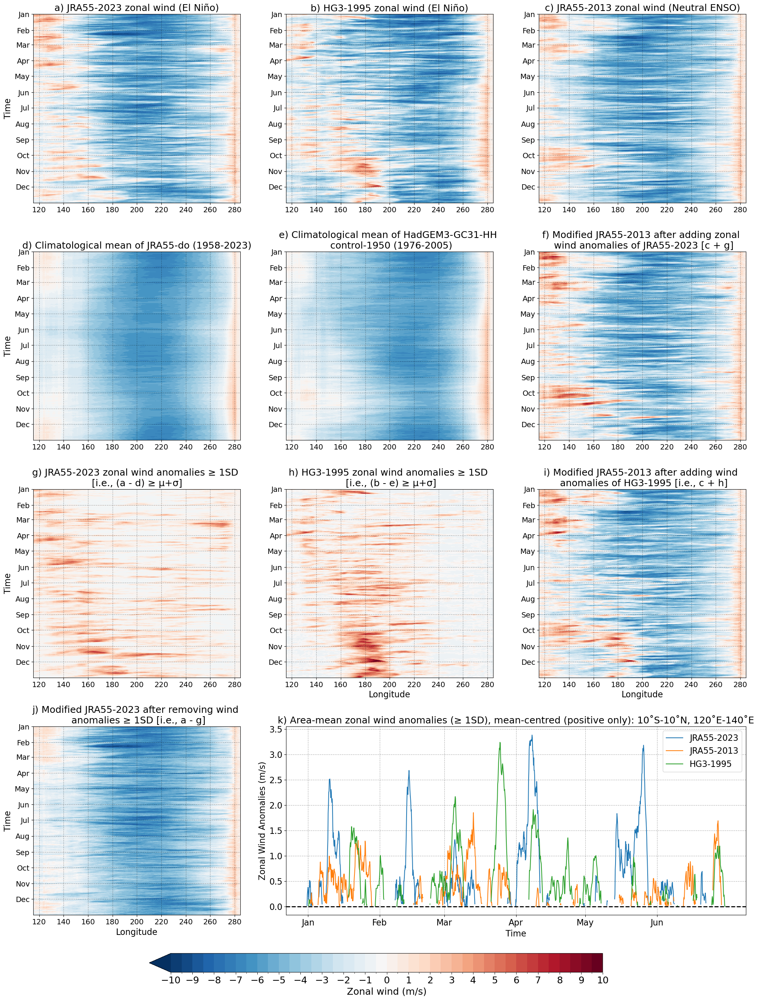

In [13]:
# =============================================================================
# PLOTTING FIGURE 1: Longitude-time Hovmollers of zonal wind fields (uas) and 
# anomalous westerlies that have been isolated.
# =============================================================================

FIG1_LEVELS = np.arange(-10, 10.1, 0.5) # Common contour levels for all panels in Figure 1


fig = plt.figure(figsize=(20, 25))
# The figure is configured with GridSpec to create a 4x3 grid layout for the 10 Hovmoller-style panels (a-j) + 1 
# additional panel spanning two columns  (panel k) in Figure 1
gs = gridspec.GridSpec(4, 3, figure=fig) 

# Figure grid-specs for the 10 Hovmoller-style panels (a-j) in Figure 1:
# ((grid row, grid col), data, title, xlabel, ylabel) for the 10 Hovmoller-style
# panels (a-j); xlabel/ylabel are only set on the bottom row/left column
panel_specs = [
    ((0, 0), CTRL_WND_FIELDS['CTRL-2023']['uas'],
     'a) JRA55-2023 zonal wind (El Niño)', '', 'Time'),
    ((0, 1), CTRL_WND_FIELDS['HG3-1995']['uas'],
     'b) HG3-1995 zonal wind (El Niño)', '', ''),
    ((0, 2), CTRL_WND_FIELDS['CTRL-2013']['uas'],
     'c) JRA55-2013 zonal wind (Neutral ENSO)', '', ''),
    ((1, 0), BASELINE_WND_FLDS['JRA55-do']['uas'],
     'd) Climatological mean of JRA55-do (1958-2023)', '', 'Time'),
    ((1, 1), BASELINE_WND_FLDS['BASELINE_HG3']['uas'],
     'e) Climatological mean of HadGEM3-GC31-HH \n control-1950 (1976-2005)', '', ''),
    ((1, 2), EXP_WND_FIELDS['ANWTRN-JRA']['uas'],
     'f) Modified JRA55-2013 after adding zonal \n wind anomalies of JRA55-2023 [c + g]', '', ''),
    ((2, 0), UAS_ANOMS_1SD['JRA55-2023-ANOMS']['uas'],
     'g) JRA55-2023 zonal wind anomalies ≥ 1SD \n[i.e., (a - d) ≥ µ+σ]', '', 'Time'),
    ((2, 1), UAS_ANOMS_1SD['HG3-1995-ANOMS']['uas'],
     'h) HG3-1995 zonal wind anomalies ≥ 1SD \n [i.e., (b - e) ≥ µ+σ]', 'Longitude', ''),
    ((2, 2), EXP_WND_FIELDS['ANWTRN-HG3']['uas'],
     'i) Modified JRA55-2013 after adding wind \n anomalies of HG3-1995 [i.e., c + h]', 'Longitude', ''),
    ((3, 0), EXP_WND_FIELDS['ANWSUP']['uas'],
     'j) Modified JRA55-2023 after removing wind \n anomalies ≥ 1SD [i.e., a - g]', 'Longitude', 'Time'),
]

# Plotting the 10 Hovmoller-style panels (a-j) in Figure 1, looping one-by-one through the panel_specs list.
for (row, col), da, title, xlabel, ylabel in panel_specs:
    ax = fig.add_subplot(gs[row, col]) # Adding a subplot to the figure at the specified grid location
    # Slicing over the equatorial Pacific region, and calculating mean over latitude. 
    sub = da.sel(lat=PACIFIC_LAT_SLICE, lon=PACIFIC_LON_SLICE).mean(dim=['lat']) 
    c = sub.plot.contourf(ax=ax, levels=FIG1_LEVELS, cmap='RdBu_r', add_colorbar=False, yincrease=False)
    ax.set_title(title, fontsize=18)
    format_axis(ax, 'wind_time', row, 4, xlabel=xlabel, ylabel=ylabel, time=sub['time'].values)
    # format_axis is a utility function for styling the axes, check utils.py for more info.

# Panel k: Area-mean zonal wind anomalies (≥ 1SD), mean-centred (positive only): 10S-10N, 120E-140E
ax_long = fig.add_subplot(gs[3, 1:]) # Spanning the last row of the grid layout, across two columns (1 and 2) for panel k
for name, label in [('JRA55-2023-ANOMS', 'JRA55-2023'), ('JRA55-2013-ANOMS', 'JRA55-2013'), ('HG3-1995-ANOMS', 'HG3-1995')]:
    # Function that returns positive-only zonal wind anomalies (mean-centred) in the Niño 4 box.
    n4_mean = n4_box_positive_anom_mean(UAS_ANOMS_1SD[name]['uas']) 
    ax_long.plot(n4_mean['time'], n4_mean, label=label)

# Axes formatting for panel k
ax_long.legend(fontsize=16)
ax_long.axhline(0, ls='--', color='black', lw=2)
ax_long.set_xticks(ticks=[t.values for t in n4_mean['time'].resample(time='1D').mean() if t.dt.day == 1],
                    labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun'])
ax_long.set_xlabel('Time', fontsize=16)
ax_long.set_ylabel('Zonal Wind Anomalies (m/s)', fontsize=16)
ax_long.set_title('k) Area-mean zonal wind anomalies (≥ 1SD), mean-centred (positive only): 10˚S-10˚N, 120˚E-140˚E', fontsize=18)
ax_long.grid(True, alpha=0.3, ls='--', color='k')
ax_long.tick_params(axis='both', labelsize=16)

# Formatting the common colorbar for the Hovmoller panels (a-j) in Figure 1
cbar_ax = fig.add_axes([0.2, -0.03, 0.6, 0.02])
cbar = fig.colorbar(c, cax=cbar_ax, orientation='horizontal', ticks=np.arange(-10, 10.1, 1), extend='both')
cbar.set_label(label='Zonal wind (m/s)', size=18)
cbar.ax.tick_params(labelsize=18)
# Figure layout adjustments to ensure proper spacing between subplots and colorbar
fig.tight_layout(h_pad=3, w_pad=3)
# Saving Figure 1 for the manuscript.
fig.savefig('./figures/figure_1.png', bbox_inches='tight', dpi=300)


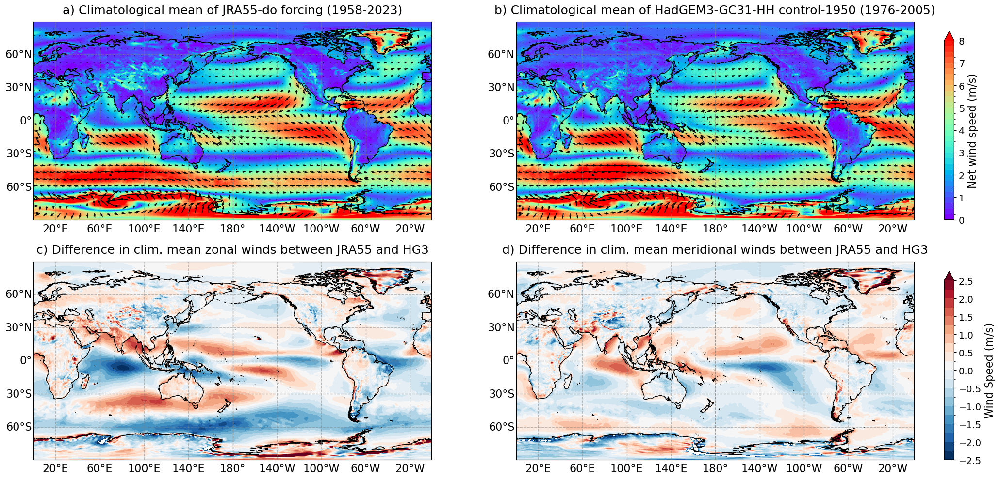

In [14]:
# ========================================================================================================
# PLOTTING FIGURE 2: Climatological mean winds (net wind speed shaded + wind vectors) of JRA55-do forcing 
# (1958-2023) and the HG3 simulation (BASELINE_HG3: 1976-2005), along with their differences 
# (BASELINE_HG3 - JRA55-do clim. mean) to illustrate the climatological correction factors applied 
# in the WNDREP-HG3c experiment. The figure is configured as a 2x2 grid layout.
# ========================================================================================================
fig, axes = plt.subplots(2, 2, figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
axes = axes.flatten()

# Panel data and titles for the 4 panels in Figure 2
panel_data = [BASELINE_WND_FLDS['JRA55-do'], BASELINE_WND_FLDS['BASELINE_HG3'],
              CLIM_CORR['UAS']['uas'], CLIM_CORR['VAS']['vas']]
panel_titles = ['a) Climatological mean of JRA55-do forcing (1958-2023)',
                'b) Climatological mean of HadGEM3-GC31-HH control-1950 (1976-2005)',
                'c) Difference in clim. mean zonal winds between JRA55 and HG3',
                'd) Difference in clim. mean meridional winds between JRA55 and HG3']

# Looping through the 4 panels in Figure 2 to plot the climatological mean winds and their differences
for i, (ax, ds_dict, title) in enumerate(zip(axes, panel_data, panel_titles)):
    if i < 2:
        # Function to calculate and plot the net wind speed (m/s) averaged over time, 
        # with specified contour levels and no colorbar (shared colorbar for panels a 
        # and b added later), along with wind vectors built from mean uas and vas 
        # components (plotted as quiver arrows).
        c_top = net_wnd_speed_tavg(ds_dict, ax, levs=np.arange(0, 8.1, 0.25), cbar=False)
    else:
        # Plotting the climatological 'correction' factors as contourf plots, with specified 
        # contour levels and no colorbar (a shared colorbar will be added later for panels c and d)
        c_bot = ds_dict.mean(dim=['time']).plot.contourf(x='lon', y='lat', cmap='RdBu_r',
                                                   levels=np.arange(-2.5, 2.51, 0.25),
                                                   transform=ccrs.PlateCarree(), ax=ax,
                                                   extend='max', add_colorbar=False)
    ax.set_title(title, fontsize=18, pad=12)
    format_axis(ax, 'wind_map', 0, 1) # Axes formatting
# Figure layout adjustments to ensure proper spacing between subplots
fig.tight_layout(w_pad=1.5, h_pad=1.5)
# Adding shared colorbars for the top and bottom panels in Figure 2, with specified labels, ticks, and formatting
add_colorbar(fig, axes=list(axes[0:2]), mappable=c_top, label='Net wind speed (m/s)',
             ticks=np.arange(0, 8.1, 1), side='right', height_scale=0.95, labelsize=16,ticksize=14)
add_colorbar(fig, axes=list(axes[2:4]), mappable=c_bot, label='Wind Speed (m/s)',
             ticks=np.arange(-2.5, 2.51, 0.5), side='right', height_scale=0.95, labelsize=16,ticksize=14)
# Saving Figure 2 for the manuscript.
fig.savefig('./figures/figure_2.png', bbox_inches='tight', dpi=300)

# Section 3.1 : Suppressing anomalous westerlies in an El Niño year

In [9]:
# Sub-plot titles for each experiment/control-equivalent in the figures 
# in Section 3.1, keyed by experiment/internal id (used in the panel headers below)
fig_titles = {'CTRL_2023' : 'Control run (JRA55-do atmosphere forced) 2023',
              'ANWSUP' : 'ANWSUP: Anom. westerlies removed by statistical threshold'}

# Niño-box SST anomaly (ANWSUP vs its control), used in the Figure 3 SSTA plots as a legend text annotation
ssta_change_nb = compute_nino_ssta_change(exps=['CTRL_2023', 'ANWSUP'], period=('2023-10-01', '2023-12-31'))

# Niño-box Ocean Heat Content (OHC) anomaly (ANWSUP vs its control), used in the Figure 3 OHCA plots as a legend text annotation
ohca_change_nb = compute_nino_ohca_change(exps=['CTRL_2023', 'ANWSUP'])

/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:642: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  mean_ohc_exp = xr.merge([ohc_t300m_calc(m=m, freq='1m', exp=exp) for m in months])
/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:642: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_

/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:155: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time_counter' ('time_counter',) The recommendation is to set join explicitly for this case.
  return renamer(xr.merge([xr.open_dataset('./data/TOCE_CON/TOCE_CON_{exp}_{freq}_M10.nc'.format(exp=exp, freq=freq)),
/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:155: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimen

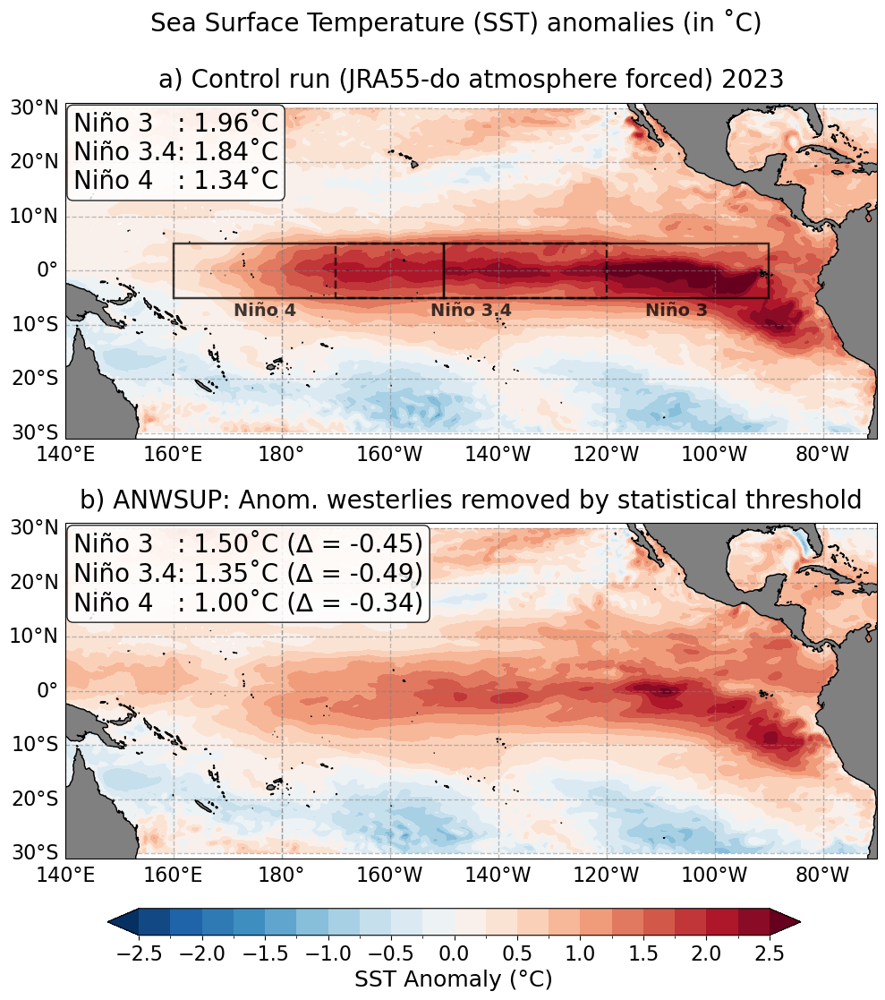

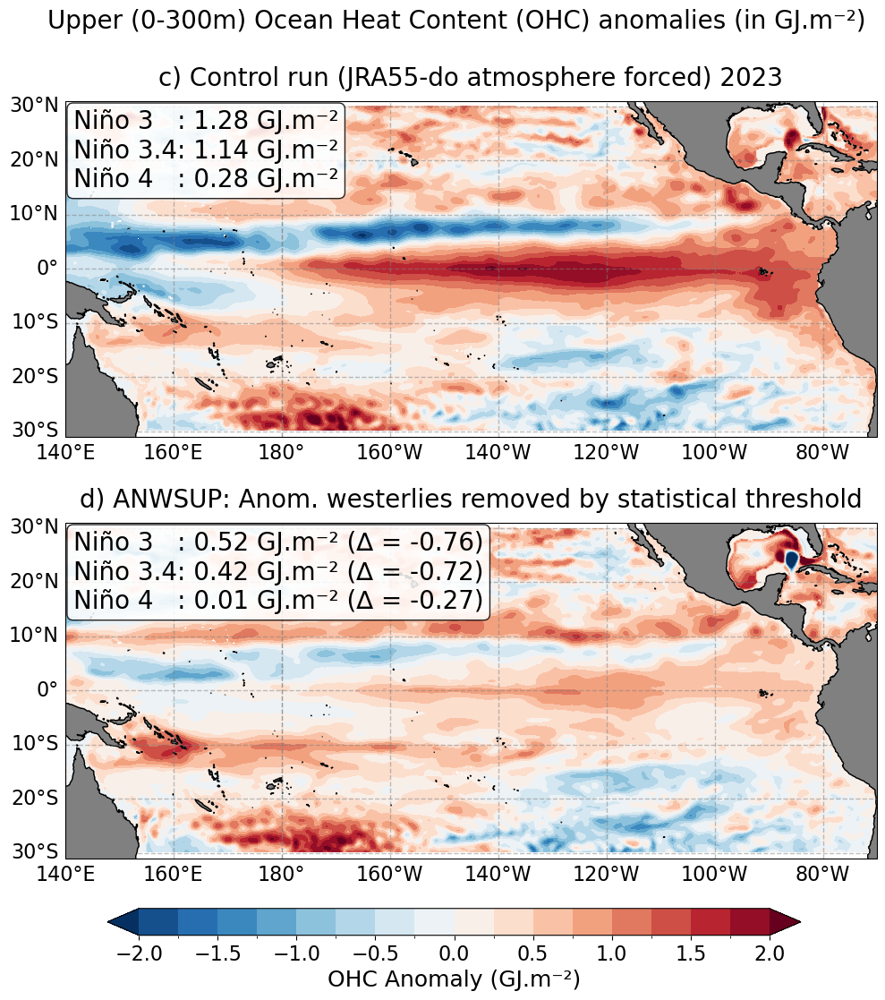

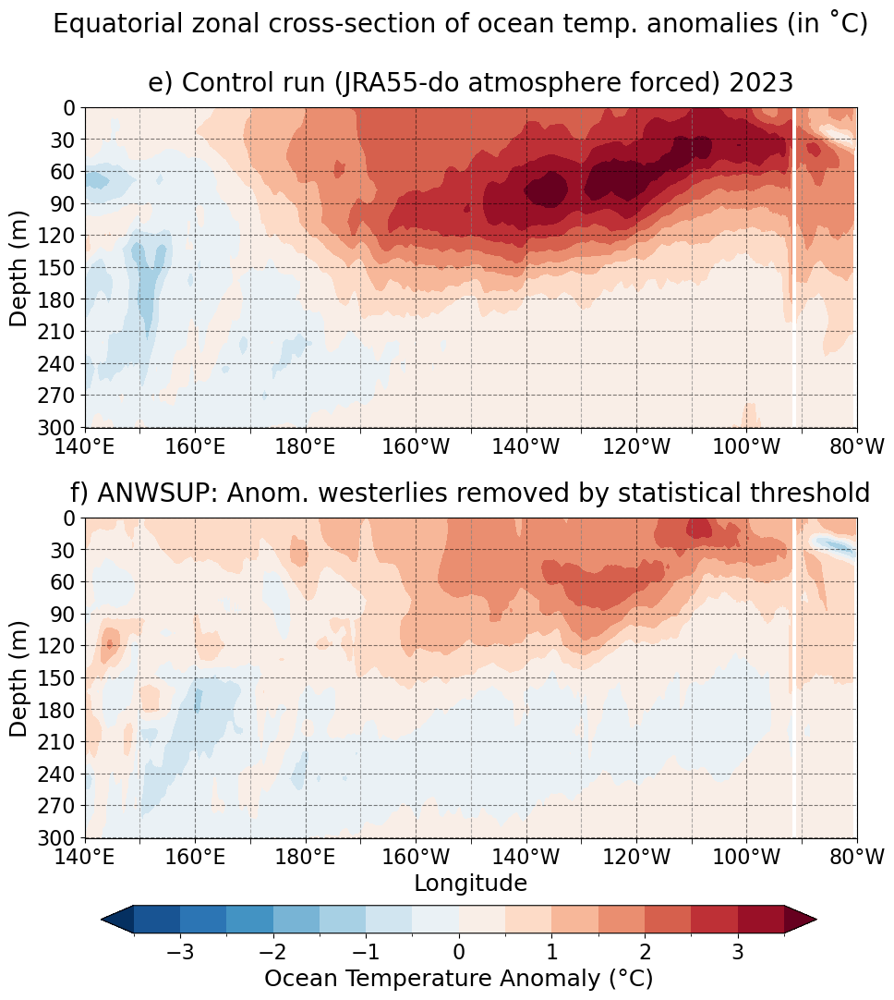

In [10]:
# ==========================================================================================
# PLOTTING FIGURE 3: SST anomaly maps (panel A), OHC anomaly maps (panel B) and equatorial 
# depth-longitude cross-sections of temperature anomalies (panel C)for the ANWSUP experiment 
# and its control equivalent(CTRL_2023).
# ==========================================================================================

'''
Note: Figure 3 is broken into three separate panels (A, B, C) for each quantity being plotted, 
with 2 subplots per panel (one for the control and one for the ANWSUP experiment),and each panel 
saved as a separate PNG file and merged to form the final Figure 3 in the manuscript. The plotting 
functions used here are defined in utils.py. This separation was done to ensure control on orientation 
and layout of individual panels corresponding to any particular quantity,for easier adjustments 
(e.g., adapting figures for poster presentations, etc.). Each panel has its own plotting function, 
defined in utils.py, which handles styling, layout, colourbars, and other figure aesthetics.
The same logic applies for Figures 5 and 7 later on, which correspond to the other two experiment 
groups (ANWTRN and WNDREP); individual panels are created and saved separately, then merged to form the 
final figure used in the manuscript
'''

# Figure 3 panel A: SST anomaly maps
plot_anomaly_map_panel(
    kind='ssta', exps=['CTRL_2023', 'ANWSUP'], fig_titles=fig_titles,
    change_df=ssta_change_nb, ctrl_exp='CTRL_2023', panel_index=0, n_rows=2,
    levels=np.arange(-2.5, 2.51, 0.25),
    cbar_kwargs=dict(label='SST Anomaly (°C)', ticks=np.arange(-2.5, 2.51, 0.5),
                      side='bottom', height=0.03, pad=0.145, labelsize=18, ticksize=16),
    savepath='./figures/figure_3_panelA.png',
    suptitle='Sea Surface Temperature (SST) anomalies (in ˚C)',
    show_nino_boxes=True, nino_boxes_n_axes=1, nino_box_kwargs=dict(label_fontsize=14))

# Figure 3 panel B: upper-300m ocean heat content anomaly maps
plot_anomaly_map_panel(
    kind='ohc', exps=['CTRL_2023', 'ANWSUP'], fig_titles=fig_titles,
    change_df=ohca_change_nb, ctrl_exp='CTRL_2023', panel_index=1, n_rows=2,
    levels=np.arange(-2, 2.1, 0.25),
    cbar_kwargs=dict(label='OHC Anomaly (GJ.m⁻²)', ticks=np.arange(-2, 2.1, 0.5),
                      side='bottom', height=0.03, pad=0.145, labelsize=18, ticksize=16),
    savepath='./figures/figure_3_panelB.png',
    suptitle='Upper (0-300m) Ocean Heat Content (OHC) anomalies (in GJ.m⁻²)')

# Figure 3 panel C: equatorial depth/longitude cross-section of the temperature anomaly
plot_zonal_panel(
    exps=['CTRL_2023', 'ANWSUP'], fig_titles=fig_titles, panel_index=2, n_rows=2,
    levels=np.arange(-3.5, 3.51, 0.5),
    cbar_kwargs=dict(label='Ocean Temperature Anomaly (°C)', ticks=np.arange(-3, 3.1, 1),
                      side='bottom', height=0.03, pad=0.125, labelsize=18, ticksize=16),
    savepath='./figures/figure_3_panelC.png',
    suptitle='Equatorial zonal cross-section of ocean temp. anomalies (in ˚C)',
    suptitle_y=0.985, tight_layout_pad=1.85)

In [17]:
# Shared setup for the Figure 4/6/8 attribution panels below: per-experiment
# volume/heat budget datasets, the two control runs, and a day-of-year
# climatology used as the trajectory panels' reference

# Loading in volume/heat budget dataset per experiment, keyed by experiment ID
EXPS = {'ANWSUP': xr.open_dataset('./data/VOL_HEAT_BUDGETS/BUDGETS_ANWSUP_20230101-20231231.nc').squeeze(), 
        'ANWTRN-JRA': xr.open_dataset('./data/VOL_HEAT_BUDGETS/BUDGETS_ANWTRN-JRA_20130101-20131231.nc').squeeze(), 
        'ANWTRN-HG3': xr.open_dataset('./data/VOL_HEAT_BUDGETS/BUDGETS_ANWTRN-HG3_20130101-20131231.nc').squeeze(), 
        'WNDREP-HG3': xr.open_dataset('./data/VOL_HEAT_BUDGETS/BUDGETS_WNDREP-HG3_20130101-20131231.nc').squeeze(), 
        'WNDREP-HG3c': xr.open_dataset('./data/VOL_HEAT_BUDGETS/BUDGETS_WNDREP-HG3c_20130101-20131231.nc').squeeze()}
        
# Budgets of the control equivalents for the 2023 (Section 3.1) and 2013 (Sections 3.2/3.3) comparisons
CTRL_2023 = xr.open_dataset('./data/VOL_HEAT_BUDGETS/BUDGETS_CTRL_2023_20230101-20231231.nc').squeeze()
CTRL_2013 = xr.open_dataset('./data/VOL_HEAT_BUDGETS/BUDGETS_CTRL_2013_20130101-20131231.nc').squeeze()

# BASELINE_NPD (1996-2023) budget, collapsed to a 365-day day-of-year climatology so it 
# can be compared against any single-year experiment in plot_trajectory_panel function (used in Figures 4/6/8)
CLIM = xr.open_dataset('./data/VOL_HEAT_BUDGETS/BUDGETS_BASELINE_NPD_1996-2023.nc').squeeze()
# Drop leap days so every year contributes exactly 365 days to the day-of-year average
CLIM = CLIM.where(~((CLIM.time_counter.dt.month == 2) & (CLIM.time_counter.dt.day == 29)), drop = True)
# Collapse the multi-year time axis down to a single "MM-DD" label per day...
CLIM['time_counter'] = [str(_).split('T')[0][-5:] for _ in CLIM['time_counter'].values]
# Average across years to get one value per day of the year
CLIM = CLIM.groupby('time_counter').mean()
# Relabel the day-of-year axis back onto a real calendar. Any experiment year works to relabel the axis, 
# since all experiments are on non-leap years)
CLIM['time_counter'] = EXPS['ANWSUP']['time_counter'].values

# Depth brackets used as the three columns in every Figure 4/6/8 panel
DEPTH_RANGES = ['0-60', '60-120', '120-180']

/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:1059: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=2, w_pad=1)


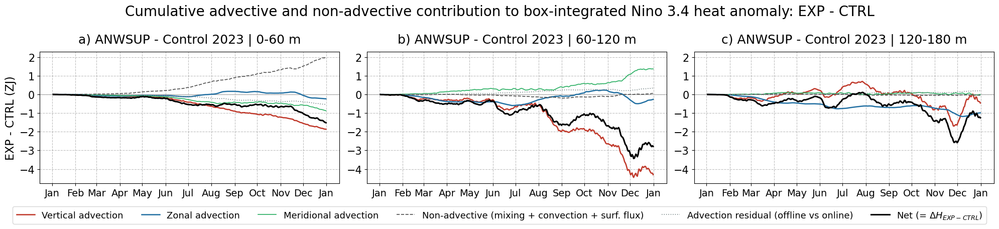

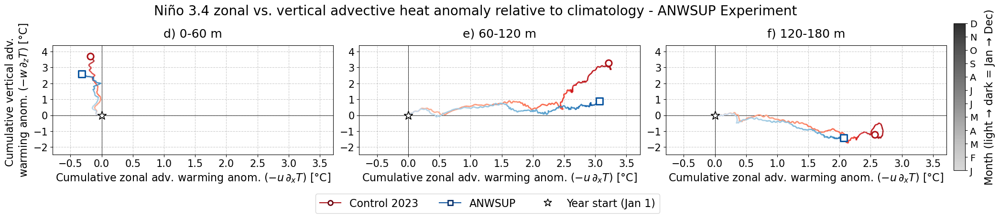

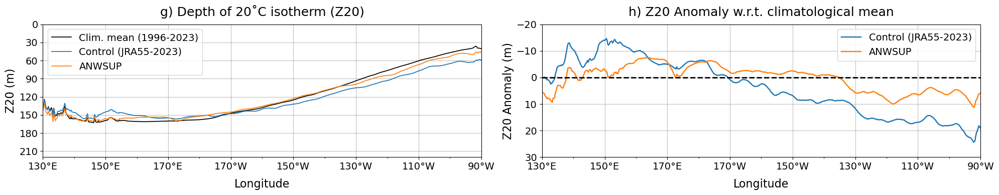

In [18]:
# ==================================================================================================
# PLOTTING FIGURE 4: Heat budget and thermocline diagnostics for ANWSUP relative to CTRL_2023,
# showing cumulative volume-integrated Niño 3.4 heat content anomaly (experiment - control) for 
# different depth layers (panel A), cumulative advective warming/cooling anomaly for the same layers 
# as zonal vs. vertical trajectories relative to climatology (panel B), and the depth of 20degC 
# isotherm (Z20) and its anomaly (panel C).
# ==================================================================================================

'''
Note: Figure 4, similar to Figure 3, is broken into three separate panels (A, B, C) for each 
diagnostic being plotted and each panel saved as a separate PNG file and merged to form the 
final Figure 4 in the manuscript. The plotting functions used here are defined in utils.py.
'''

# Figure 4 panel A: Cumulative heat-budget attribution (experiment - control; ZJ)
plot_cumulative_attribution_panel(
    exp_ids=['ANWSUP'], ctrl=CTRL_2023, ctrl_label='Control 2023', exp_ds_dict = EXPS,
    depth_ranges=DEPTH_RANGES, savepath='./figures/figure_4_panelA.png', y_tick_intervals=1)

# Figure 4 panel B: Zonal vs vertical advective heat (in cumulative degC) trajectory
plot_trajectory_panel(
    runs=[('Control 2023', CTRL_2023, 'o', 'Reds'),
          ('ANWSUP', EXPS['ANWSUP'], 's', 'Blues')],
    clim = CLIM,
    depth_ranges = DEPTH_RANGES,
    n_exp_rows=1,
    group_title='Niño 3.4 zonal vs. vertical advective heat anomaly relative to climatology - ANWSUP Experiment',
    savepath='./figures/figure_4_panelB.png',
    x_tick_intervals=0.5,
    y_tick_intervals=1)

# Figure 4 panel C: Depth of the 20C isotherm (Z20) and its anomaly
plot_z20_panel(
    exps=['CTRL_2023', 'ANWSUP'], labels=['Control (JRA55-2023)', 'ANWSUP'],
    period=('2023-10-01', '2023-12-31'), letter_offset=6,
    savepath='./figures/figure_4_panelC.png', figsize=(20, 4),
    baseline_styles={'BASELINE_NPD': {'label': 'Clim. mean (1996-2023)', 'color': 'k', 'ls': '-'}},
    ylim_right=(30, -20), yticks_right=np.arange(30, -21, -10))

In [11]:
# Merging all individual panels of Figures 3 and 4 into a single figure for each
merge_pngs_horizontal(
    [
        "./figures/figure_3_panelA.png",
        "./figures/figure_3_panelB.png",
        "./figures/figure_3_panelC.png",
    ],
    "./figures/figure_3.png",
)

merge_pngs_vertical(
    [
        "./figures/figure_4_panelA.png",
        "./figures/figure_4_panelB.png",
        "./figures/figure_4_panelC.png",
    ],
    "./figures/figure_4.png",
)

# Section 3.2 : Transplanting anomalous westerlies from an El Niño year into a neutral year

In [ ]:
# Sub-plot titles for each experiment/control-equivalent in the figures 
# in Section 3.2, keyed by experiment/internal id (used in the panel headers below)
fig_titles = {'CTRL_2013' : 'Control run (JRA55-do atmosphere forced) 2013',
              'ANWTRN-JRA' : 'ANWTRN-JRA: Transplanting JRA55-2023 anomalous\nwesterlies onto JRA55-2013',
              'ANWTRN-HG3' : 'ANWTRN-HG3: Transplanting HG3-1995 anomalous\nwesterlies onto JRA55-2013',
             }
# Niño-box SST anomaly (ANWTRN exps vs its control), used in the Figure 5 SSTA plots as a legend text annotation
ssta_change_nb = compute_nino_ssta_change(
    exps=['CTRL_2013', 'ANWTRN-JRA', 'ANWTRN-HG3'], period=('2013-10-01', '2013-12-31'))

# Niño-box Ocean Heat Content (OHC) anomaly (ANWTRN exps vs its control), used in the Figure 5 OHCA plots as a legend text annotation
ohca_change_nb = compute_nino_ohca_change(exps=['CTRL_2013', 'ANWTRN-JRA', 'ANWTRN-HG3'])

/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:642: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  mean_ohc_exp = xr.merge([ohc_t300m_calc(m=m, freq='1m', exp=exp) for m in months])
/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:642: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_

/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:155: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time_counter' ('time_counter',) The recommendation is to set join explicitly for this case.
  return renamer(xr.merge([xr.open_dataset('./data/TOCE_CON/TOCE_CON_{exp}_{freq}_M10.nc'.format(exp=exp, freq=freq)),
/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:155: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimen

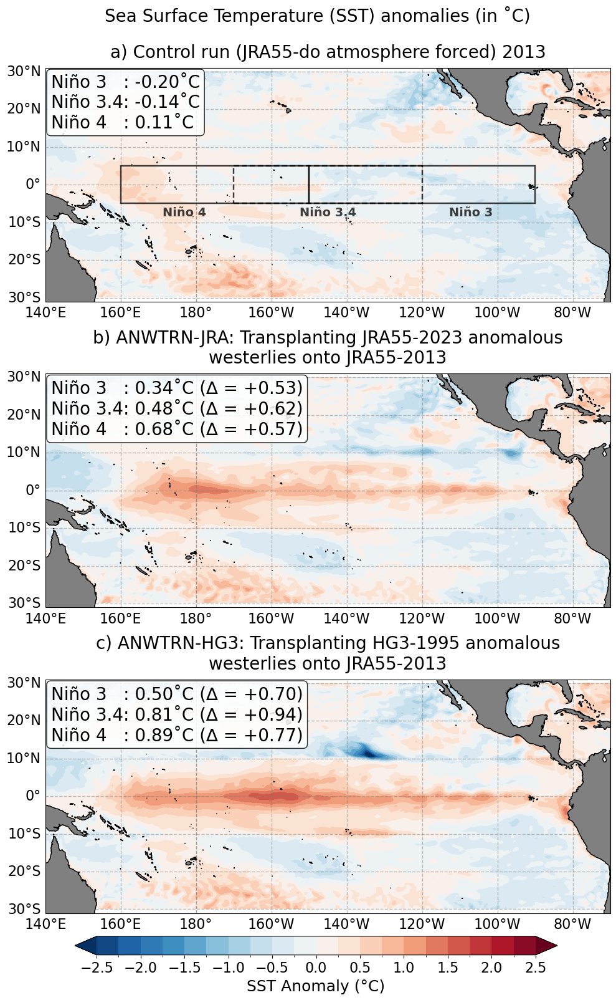

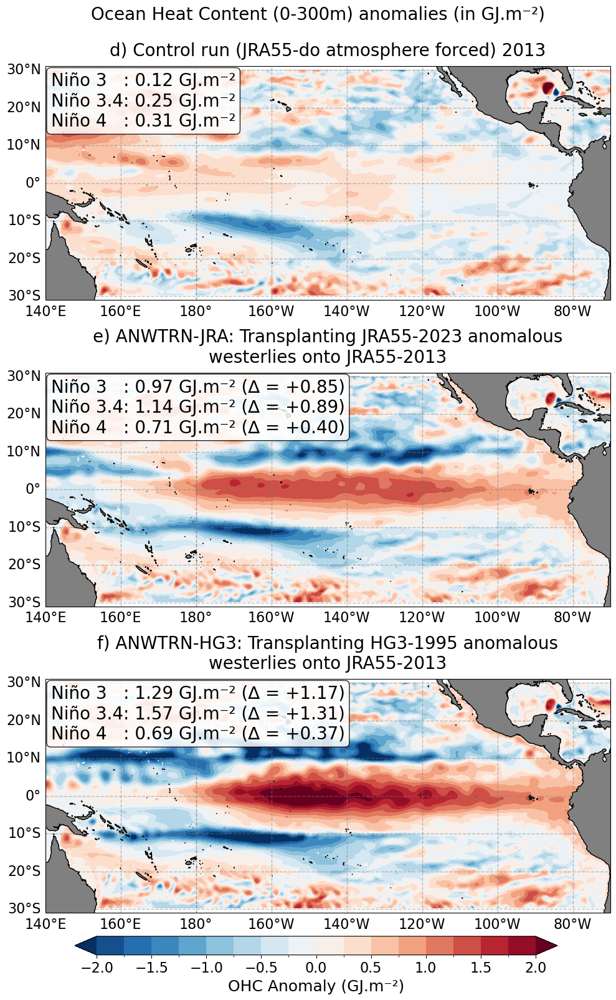

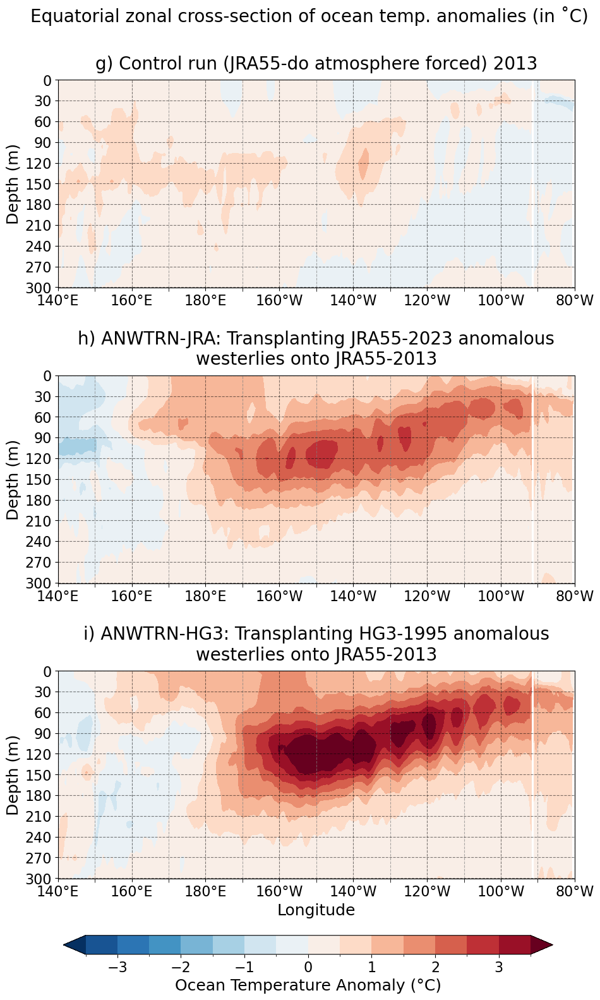

In [13]:
# ============================================================================================
# PLOTTING FIGURE 5: SST anomaly maps (panel A), OHC anomaly maps (panel B) and equatorial 
# depth-longitude cross-sections of temperature anomalies (panel C) for the ANWTRN experiments 
# and their control equivalent(CTRL_2013).
# ============================================================================================

'''
Note: Figure 5, similar to Figure 3, is broken into three separate panels (A, B, C) for each 
quantity being plotted, and each experiment/control-equivalent is shown in a separate subplot 
within each panel. Each panel is saved as a separate PNG file and merged to form the final 
Figure 5 in the manuscript. The plotting functions used here are defined in utils.py. 
'''

# Figure 5 panel A: SST anomaly maps
plot_anomaly_map_panel(
    kind='ssta', exps=['CTRL_2013', 'ANWTRN-JRA', 'ANWTRN-HG3'], fig_titles=fig_titles,
    change_df=ssta_change_nb, ctrl_exp='CTRL_2013', panel_index=0, n_rows=3,
    levels=np.arange(-2.5, 2.51, 0.25),
    cbar_kwargs=dict(label='SST Anomaly (°C)', ticks=np.arange(-2.5, 2.51, 0.5),
                      side='bottom', height=0.02, pad=0.125, labelsize=18, ticksize=16),
    savepath='./figures/figure_5_panelA.png',
    suptitle='Sea Surface Temperature (SST) anomalies (in ˚C)',
    show_nino_boxes=True, nino_boxes_n_axes=1, nino_box_kwargs=dict(label_fontsize=14))

# Figure 5 panel B: upper-300m ocean heat content anomaly maps
plot_anomaly_map_panel(
    kind='ohc', exps=['CTRL_2013', 'ANWTRN-JRA', 'ANWTRN-HG3'], fig_titles=fig_titles,
    change_df=ohca_change_nb, ctrl_exp='CTRL_2013', panel_index=1, n_rows=3,
    levels=np.arange(-2, 2.1, 0.25),
    cbar_kwargs=dict(label='OHC Anomaly (GJ.m⁻²)', ticks=np.arange(-2, 2.1, 0.5),
                      side='bottom', height=0.02, pad=0.125, labelsize=18, ticksize=16),
    savepath='./figures/figure_5_panelB.png',
    suptitle='Ocean Heat Content (0-300m) anomalies (in GJ.m⁻²)')

# Figure 5 panel C: equatorial depth/longitude cross-section of the temperature anomaly
plot_zonal_panel(
    exps=['CTRL_2013', 'ANWTRN-JRA', 'ANWTRN-HG3'], fig_titles=fig_titles, panel_index=2, n_rows=3,
    levels=np.arange(-3.5, 3.51, 0.5),
    cbar_kwargs=dict(label='Ocean Temperature Anomaly (°C)', ticks=np.arange(-3, 3.1, 1),
                      side='bottom', height=0.02, pad=0.125, labelsize=18, ticksize=16),
    savepath='./figures/figure_5_panelC.png',
    suptitle='Equatorial zonal cross-section of ocean temp. anomalies (in ˚C)',
    suptitle_y=0.985, tight_layout_pad=2.5)

/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:1059: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=2, w_pad=1)


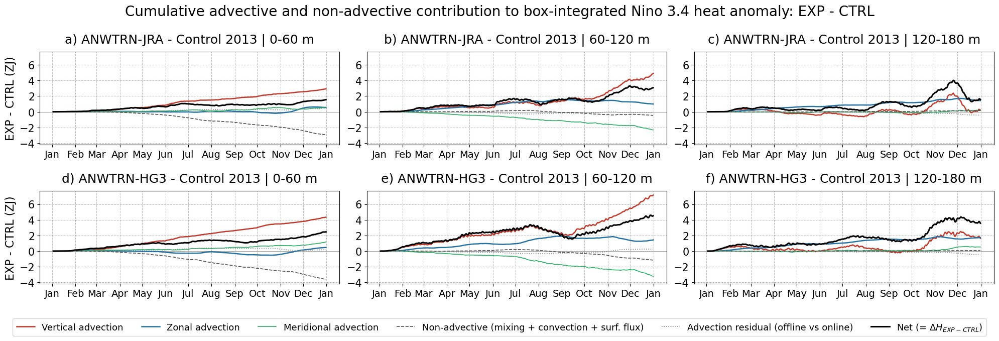

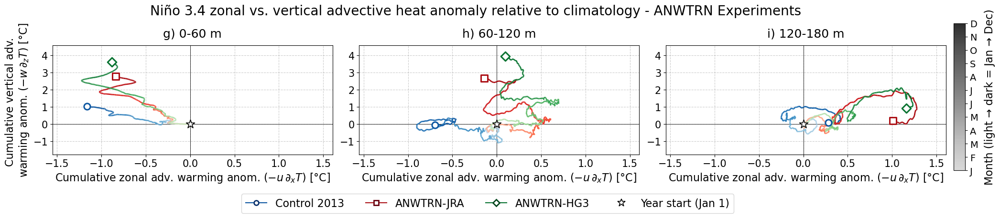

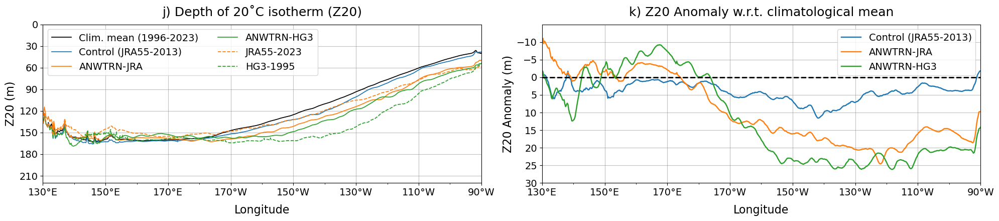

In [22]:
# =================================================================================================================
# PLOTTING FIGURE 6: Heat budget and thermocline diagnostics for ANWTRN experiments relative to CTRL_2013/HG3-1995,
# showing cumulative volume-integrated Niño 3.4 heat content anomaly (experiment - control) for 
# different depth layers (panel A), cumulative advective warming/cooling anomaly for the same layers 
# as zonal vs. vertical trajectories relative to climatology (panel B), and the depth of 20degC isotherm (Z20) 
# and its anomaly (panel C).
# =================================================================================================================

'''
Note: Figure 6, similar to Figure 4, is broken into three separate panels (A, B, C) for each 
diagnostic being plotted and each panel saved as a separate PNG file and merged to form the 
final Figure 6 in the manuscript. The plotting functions used here are defined in utils.py.
'''

# Figure 6 panel A: Cumulative heat-budget attribution (experiment - control; ZJ)
plot_cumulative_attribution_panel(
    exp_ids=['ANWTRN-JRA', 'ANWTRN-HG3'], ctrl=CTRL_2013, ctrl_label='Control 2013', exp_ds_dict = EXPS,
    depth_ranges=DEPTH_RANGES, savepath='./figures/figure_6_panelA.png', y_tick_intervals=2)

# Figure 6 panel B: Zonal vs vertical advective heat (in cumulative degC) trajectory
plot_trajectory_panel(
    runs=[('Control 2013', CTRL_2013, 'o', 'Blues'),
          ('ANWTRN-JRA', EXPS['ANWTRN-JRA'], 's', 'Reds'),
          ('ANWTRN-HG3', EXPS['ANWTRN-HG3'], 'D', 'Greens')],
    clim = CLIM,
    depth_ranges = DEPTH_RANGES,
    n_exp_rows=2,
    group_title='Niño 3.4 zonal vs. vertical advective heat anomaly relative to climatology - ANWTRN Experiments',
    savepath='./figures/figure_6_panelB.png',
    x_tick_intervals=0.5,
    y_tick_intervals=1)

# Figure 6 panel C: Depth of the 20C isotherm (Z20) and its anomaly

# Preparing two extra reference curves: the Z20 depth in CTRL_2023 and HG3-1995 ("donor" years) 
# from which anomalous westerlies were isolated and transplanted onto JRA55-2013 to build ANWTRN-JRA/HG3. 
# This was done so the transplant experiments can be compared against them.

hg3_domain = xr.open_dataset('/dssgfs01/scratch/npd/simulations/Domains/eORCA12/domain_cfg.nc').sel(nav_lev=0, method='nearest').squeeze()

# Subsetting the HG3-1995 Z20 dataset to the equatorial Pacific region (130E-270E, 5S-5N)
z20_hg3_1995 = cdo.sellonlatbox('130,270,-5,5', input='./data/Z20/Z20_HG3-1995_1m_M01-12.nc', returnXDataset=True)
# Setting 'x' dimension to latitude values along the equator for HG3-1995 (hence the domain file was loaded).
# The latitude values aren't directly available in the Z20 file that was created, hence this workaround.
lat_at_eq = hg3_domain['glamt'].where(abs(hg3_domain['gphit']) == np.nanmin(abs(hg3_domain['gphit'])), np.nan).sum(dim=['y'])
lat_at_eq['x'] = np.arange(lat_at_eq.shape[0])
lat_at_eq = lat_at_eq.sel(x=z20_hg3_1995['x'])
z20_hg3_1995['x'] = (lat_at_eq.values + 360) % 360
# HG3-1995 comes from a monthly-means (1m) data, so it gets 12 monthly time labels
z20_hg3_1995['time'] = pd.date_range(start='2013-01-01', end='2013-12-31', freq='1MS')

# Now, the same for CTRL_2023, which is on the JRA55-do grid. Longitude values along the equator available here.
z20_jra55_2023 = cdo.sellonlatbox('130,270,-5,5', input='./data/Z20/Z20_CTRL_2023_1d_M01-12.nc', returnXDataset=True)
z20_jra55_2023['x'] = z20_jra55_2023['nav_lon'][z20_jra55_2023['nav_lon'].shape[0] // 2, :].values
z20_jra55_2023['x'] = (z20_jra55_2023['x'] + 360) % 360
# Unlike HG3-1995 above, this file is daily-means (1d), so it needs 365 daily time labels here
z20_jra55_2023['time'] = pd.date_range(start='2013-01-01', end='2013-12-31', freq='1D')

# Finally, plotting the Z20 panel for the ANWTRN experiments (panel C in Figure 6), along with the 
# two reference curves for CTRL_2023 and HG3-1995.
plot_z20_panel(
    exps=['CTRL_2013', 'ANWTRN-JRA', 'ANWTRN-HG3'],
    labels=['Control (JRA55-2013)', 'ANWTRN-JRA', 'ANWTRN-HG3'],
    period=('2013-10-01', '2013-12-31'), letter_offset=9,
    savepath='./figures/figure_6_panelC.png', figsize=(20, 4.5),
    baseline_styles={'BASELINE_NPD': {'label': 'Clim. mean (1996-2023)', 'color': 'k', 'ls': '-'}},
    extra_left_lines=[(z20_jra55_2023['Z20'], 'JRA55-2023', 'C1', '--'), # Z20 here is daily data
                       (z20_hg3_1995['Z20'], 'HG3-1995', 'C2', '--')], # Z20 here is monthly data
    ylim_right=(30, -15), yticks_right=np.arange(30, -15, -5),
    legend_kwargs_left={'ncols': 2}, legend_kwargs_right={'loc': 'upper right'})


In [14]:
# Merging all individual panels of Figures 5 and 6 into a single figure for each
merge_pngs_horizontal(
    [
        "./figures/figure_5_panelA.png",
        "./figures/figure_5_panelB.png",
        "./figures/figure_5_panelC.png",
    ],
    "./figures/figure_5.png",
)

merge_pngs_vertical(
    [
        "./figures/figure_6_panelA.png",
        "./figures/figure_6_panelB.png",
        "./figures/figure_6_panelC.png",
    ],
    "./figures/figure_6.png",
)

----

# Section 3.3 : Global Replacement of JRA55-do winds with coupled model winds (HG3-1995)

In [15]:
# Sub-plot titles for each experiment/control-equivalent in the figures 
# in Section 3.3, keyed by experiment/internal id (used in the panel headers below)
fig_titles = {'CTRL_2013' : 'Control run (JRA55-do atmosphere forced) 2013',
              'HG3-1995' : 'Model year 1995 of HadGEM3-GC31-HH control-1950 (HG3-1995) ',
              'WNDREP-HG3' : 'WNDREP-HG3: Global replacement of JRA55-2013 winds\nwith HG3-1995 winds',
              'WNDREP-HG3c' : 'WNDREP-HG3c: Global replacement of JRA55-2013 winds\nwith HG3-1995 winds, with clim. correction'
             }

# Niño-box SST anomaly for the WNDREP wind-replacement experiments, used in the Figure 7 SSTA plots 
# for legend text annotation. HG3-1995 is compared against the HG3 baseline, not NPD, via exp_overrides
ssta_change_nb = compute_nino_ssta_change(
    exps=['CTRL_2013', 'HG3-1995', 'WNDREP-HG3', 'WNDREP-HG3c'],
    period=('2013-10-01', '2013-12-31'),
    exp_overrides={'HG3-1995': {'baseline': 'BASELINE_HG3', 'freq': '1m', 'reindex_year': 2013}})

# Niño-box Ocean Heat Content (OHC) anomaly for the WNDREP experiments, used in the Figure 7 OHCA plots as a legend text annotation
ohca_change_nb = compute_nino_ohca_change(
    exps=['CTRL_2013', 'HG3-1995', 'WNDREP-HG3', 'WNDREP-HG3c'],
    exp_overrides={'HG3-1995': {'baseline': 'BASELINE_HG3'}})

/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:642: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  mean_ohc_exp = xr.merge([ohc_t300m_calc(m=m, freq='1m', exp=exp) for m in months])
/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:642: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_

/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:155: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time_counter' ('time_counter',) The recommendation is to set join explicitly for this case.
  return renamer(xr.merge([xr.open_dataset('./data/TOCE_CON/TOCE_CON_{exp}_{freq}_M10.nc'.format(exp=exp, freq=freq)),
/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:155: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimen

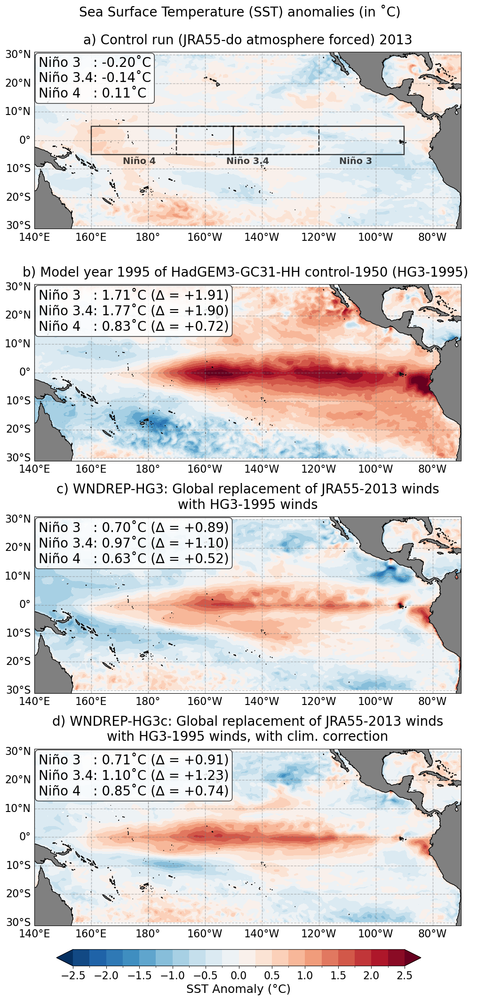

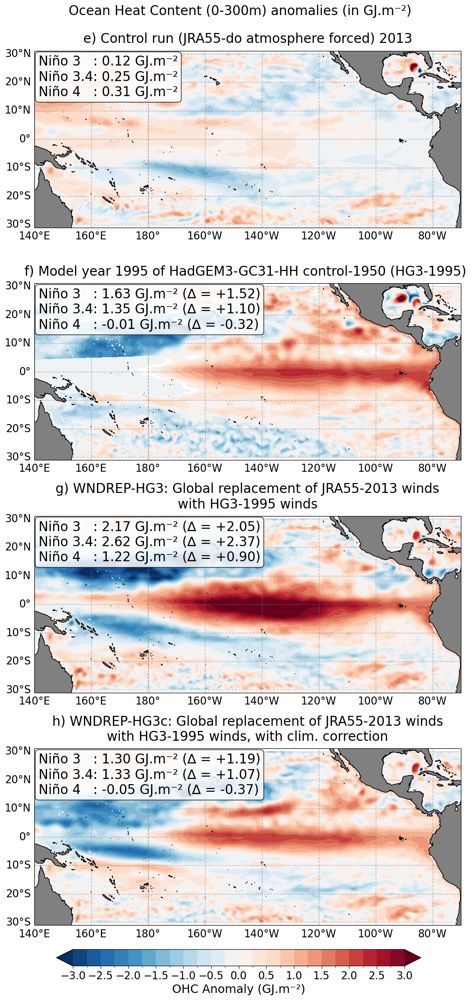

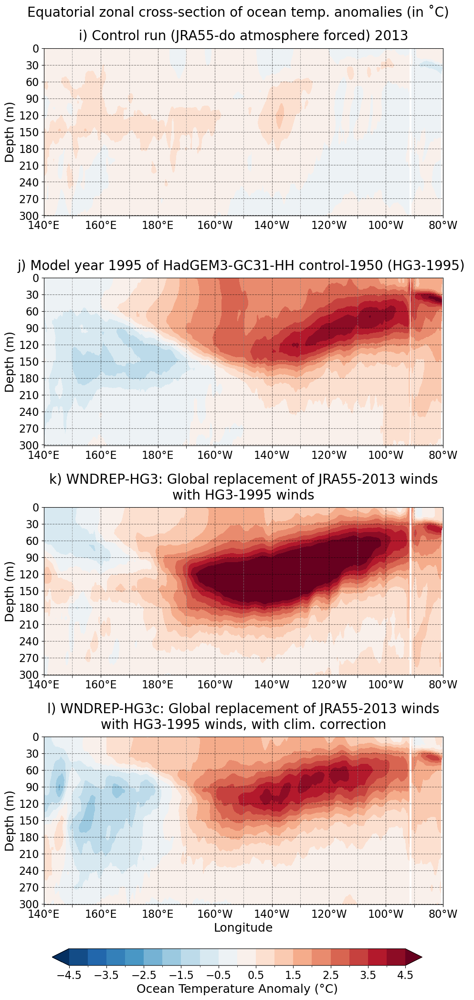

In [18]:
# ============================================================================================
# PLOTTING FIGURE 7: SST anomaly maps (panel A), OHC anomaly maps (panel B) and equatorial 
# depth-longitude cross-sections of temperature anomalies (panel C) for the WNDREP experiments 
# and their control equivalent (CTRL_2013) and HG3-1995 (coupled model El Niño).
# ============================================================================================

'''
Note: Again, Figure 7, similar to Figure 3, is broken into three separate panels (A, B, C) for each 
quantity being plotted, and each experiment/HG3-1995/control-equivalent is shown in a separate subplot 
within each panel. Each panel is saved as a separate PNG file and merged to form the final 
Figure 7 in the manuscript. The plotting functions used here are defined in utils.py. 
'''

# Figure 7 panel A: SST anomaly maps
plot_anomaly_map_panel(
    kind='ssta', exps=['CTRL_2013', 'HG3-1995', 'WNDREP-HG3', 'WNDREP-HG3c'], fig_titles=fig_titles,
    change_df=ssta_change_nb, ctrl_exp='CTRL_2013', panel_index=0, n_rows=4,
    levels=np.arange(-2.5, 2.51, 0.25),
    cbar_kwargs=dict(label='SST Anomaly (°C)', ticks=np.arange(-2.5, 2.51, 0.5),
                      side='bottom', height=0.0175, pad=0.13, labelsize=18, ticksize=16),
    savepath='./figures/figure_7_panelA.png',
    suptitle='Sea Surface Temperature (SST) anomalies (in ˚C)', suptitle_y=1.00,
    exp_overrides={'HG3-1995': {'baseline': 'BASELINE_HG3'}},
    show_nino_boxes=True, nino_boxes_n_axes=1,
    nino_box_kwargs=dict(label_fontsize=14))

# Figure 7 panel B: upper-300m ocean heat content anomaly maps
plot_anomaly_map_panel(
    kind='ohc', exps=['CTRL_2013', 'HG3-1995', 'WNDREP-HG3', 'WNDREP-HG3c'], fig_titles=fig_titles,
    change_df=ohca_change_nb, ctrl_exp='CTRL_2013', panel_index=1, n_rows=4,
    levels=np.arange(-3, 3.1, 0.25),
    cbar_kwargs=dict(label='OHC Anomaly (GJ.m⁻²)', ticks=np.arange(-3, 3.1, 0.5),
                      side='bottom', height=0.0175, pad=0.13, labelsize=18, ticksize=16),
    savepath='./figures/figure_7_panelB.png',
    suptitle='Ocean Heat Content (0-300m) anomalies (in GJ.m⁻²)', suptitle_y=1.00,
    exp_overrides={'HG3-1995': {'baseline': 'BASELINE_HG3'}})

# Figure 7 panel C: equatorial cross-section of the temperature anomaly
plot_zonal_panel(
    exps=['CTRL_2013', 'HG3-1995', 'WNDREP-HG3', 'WNDREP-HG3c'], fig_titles=fig_titles, panel_index=2, n_rows=4,
    levels=np.arange(-4.5, 4.51, 0.5),
    cbar_kwargs=dict(label='Ocean Temperature Anomaly (°C)', ticks=np.arange(-4.5, 4.51, 1),
                      side='bottom', height=0.0175, pad=0.13, labelsize=18, ticksize=16),
    savepath='./figures/figure_7_panelC.png',
    suptitle='Equatorial zonal cross-section of ocean temp. anomalies (in ˚C)',
    suptitle_y=0.985, tight_layout_pad=1.85,
    exp_overrides={'HG3-1995': {'baseline': 'BASELINE_HG3', 'y_index': 377}})

/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:1059: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(h_pad=2, w_pad=1)


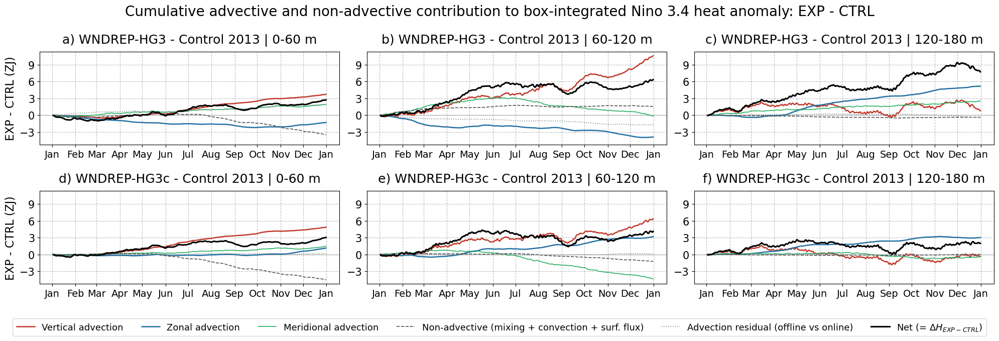

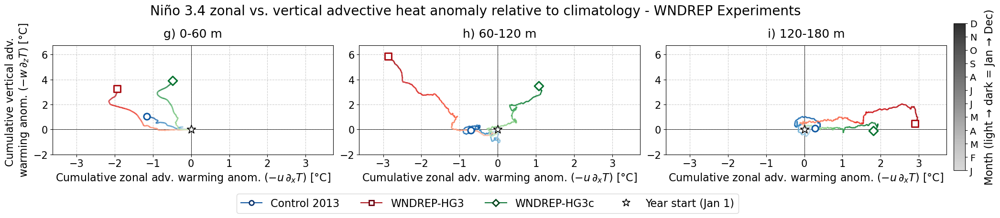

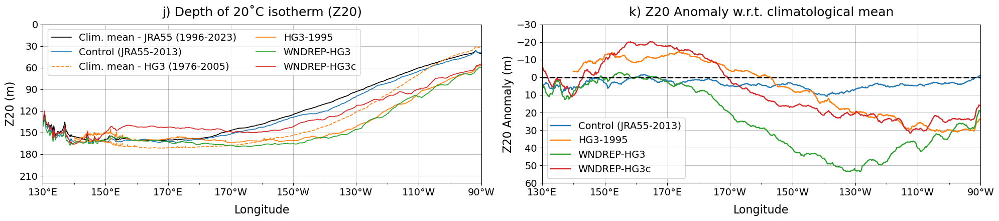

In [26]:
# ==========================================================================================================
# PLOTTING FIGURE 8: Heat budget and thermocline diagnostics for WNDREP relative to CTRL_2013/HG3-1995,
# showing cumulative volume-integrated Niño 3.4 heat content anomaly (experiment - control) for 
# different depth layers (panel A), cumulative advective warming/cooling anomaly for the same layers 
# as zonal vs. vertical trajectories relative to climatology (panel B), and the depth of 20degC isotherm (Z20) 
# and its anomaly (panel C).
# ==========================================================================================================

'''
Note: Again, Figure 8, similar to Figure 4, is broken into three separate panels (A, B, C) for each 
diagnostic being plotted and each panel saved as a separate PNG file and merged to form the 
final Figure 8 in the manuscript. The plotting functions used here are defined in utils.py.
'''

# Figure 8 panel A: Cumulative heat-budget attribution (experiment - control; ZJ)
plot_cumulative_attribution_panel(
    exp_ids=['WNDREP-HG3', 'WNDREP-HG3c'], ctrl=CTRL_2013, ctrl_label='Control 2013', exp_ds_dict = EXPS,
    depth_ranges=DEPTH_RANGES, savepath='./figures/figure_8_panelA.png', y_tick_intervals=3)

# Figure 8 panel B: Zonal vs vertical advective heat (in cumulative degC) trajectory
plot_trajectory_panel(
    runs=[('Control 2013', CTRL_2013, 'o', 'Blues'),
          ('WNDREP-HG3', EXPS['WNDREP-HG3'], 's', 'Reds'),
          ('WNDREP-HG3c', EXPS['WNDREP-HG3c'], 'D', 'Greens')],
    clim = CLIM,
    depth_ranges = DEPTH_RANGES,
    n_exp_rows=2,
    group_title='Niño 3.4 zonal vs. vertical advective heat anomaly relative to climatology - WNDREP Experiments',
    savepath='./figures/figure_8_panelB.png',
    x_tick_intervals=1,
    y_tick_intervals=2)

# Figure 8 panel C: Depth of the 20C isotherm (Z20) and its anomaly
plot_z20_panel(
    exps=['CTRL_2013', 'HG3-1995', 'WNDREP-HG3', 'WNDREP-HG3c'],
    labels=['Control (JRA55-2013)', 'HG3-1995', 'WNDREP-HG3', 'WNDREP-HG3c'],
    period=('2013-10-01', '2013-12-31'), letter_offset=9,
    savepath='./figures/figure_8_panelC.png', figsize=(20, 4.5),
    default_freq='1m',
    baseline_styles={'BASELINE_NPD': {'label': 'Clim. mean - JRA55 (1996-2023)', 'color': 'k', 'ls': '-'},
                     'BASELINE_HG3': {'label': 'Clim. mean - HG3 (1976-2005)', 'color': 'C1', 'ls': '--'}},
    exp_overrides={'HG3-1995': {'baseline': 'BASELINE_HG3', 'reindex_year': 2013}},
    ylim_right=(60, -30), yticks_right=np.arange(60, -31, -10),
    legend_kwargs_left={'ncols': 2}, legend_kwargs_right={'loc': 'lower left'})

In [19]:
# Merging all individual panels of Figures 7 and 8 into a single figure for each
merge_pngs_horizontal(
    [
        "./figures/figure_7_panelA.png",
        "./figures/figure_7_panelB.png",
        "./figures/figure_7_panelC.png",
    ],
    "./figures/figure_7.png",
)

merge_pngs_vertical(
    [
        "./figures/figure_8_panelA.png",
        "./figures/figure_8_panelB.png",
        "./figures/figure_8_panelC.png",
    ],
    "./figures/figure_8.png",
)

# Figures for 'Supporting Information'

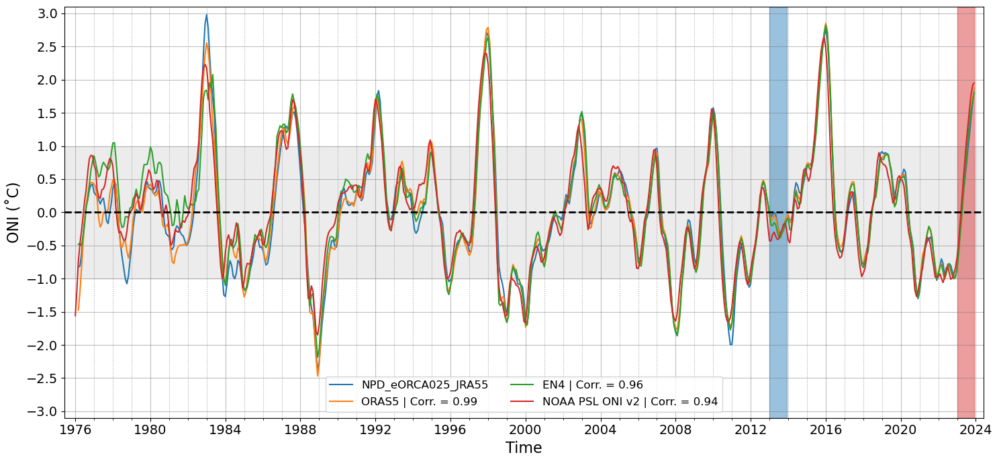

In [28]:
# ===============================================================================================================
# PLOTTING FIGURE S1: Time series from 1976-2023 of the Oceanic Niño Index (ONI) calculated over the Niño 3.4 
# region computed for the JRA55-do forced NPD control experiment (NPD_eORCA025_JRA55), observation-based datasets 
# like ORAS5 and EN4 and compared with NOAA PSL ONI v2 index. Year 2013 and 2023 shaded in blue and red.
# ===============================================================================================================

# Data reading
df = pd.read_csv('./data/ONI_N34_1976-2023.csv', index_col = 0) # ONI data from NPD_eORCA025_JRA55, ORAS5 and EN4
# This is a monthly time series, pre-calculated separately. Feel free to reach out if you have any questions about 
# how it was calculated. It's pretty straightforward (3-month running mean of area-weighted average of Niño 3.4 SSTA).
noaa_oni = pd.read_csv('./data/NOAA_ONI_PARSED.csv', index_col = 'TIME') 
# NOAA PSL ONI v2 data; downloaded from https://psl.noaa.gov/data/correlation/oni.data
noaa_oni.index = pd.to_datetime(noaa_oni.index)

# Create figure and axes
fig, ax = plt.subplots(1, 1, figsize=(15, 7))
# Time series range
ts = pd.date_range(start='1976-01-01', end='2023-12-31', freq='1MS')

# Plot each dataset with correlation in label
ax.plot(ts, df['eORCA025_JRA55'].values, label='NPD_eORCA025_JRA55')

corr, pval = pearsonr(df['eORCA025_JRA55'].dropna(), df['ORAS5'].dropna())
ax.plot(ts, df['ORAS5'].values, label=f'ORAS5 | Corr. = {corr:.2f}')

corr, pval = pearsonr(df['eORCA025_JRA55'].dropna(), df['EN4'].dropna())
ax.plot(ts, df['EN4'].values, label=f'EN4 | Corr. = {corr:.2f}')

corr, pval = pearsonr(df['eORCA025_JRA55'].dropna(), noaa_oni['1976':'2023']['ONI'][2:])
ax.plot(ts, noaa_oni['1976':'2023']['ONI'].values, label=f'NOAA PSL ONI v2 | Corr. = {corr:.2f}')

# Legend
ax.legend(ncols=2, fontsize=12, loc='lower center')

# Major ticks every 4 years from 1976 to 2024
years_major = np.arange(1976, 2025, 4)
ticks_major = pd.to_datetime([f"{year}-01-01" for year in years_major])
ax.set_xticks(ticks_major)
ax.set_xticklabels(years_major)

# Minor ticks yearly
ticks_minor = pd.date_range(start='1976-01-01', end='2024-01-01', freq='YS')
ax.set_xticks(ticks_minor, minor=True)

# Rotate major tick labels
ax.tick_params(axis='x', which='major')

# Grid: major and minor
ax.grid(which='major', linestyle='-', color='gray', alpha=0.5)
ax.grid(which='minor', linestyle=':', color='gray', alpha=0.7)
    
# Labels and axis formatting
ax.set_xlabel('Time', fontsize=16)
ax.set_ylabel('ONI (˚C)', fontsize=16)
ax.set_yticks(np.arange(-3, 3.1, 0.5))
ax.set_ylim([-3.1, 3.1])
ax.set_xlim([pd.to_datetime('1975-06-01'), pd.to_datetime('2024-06-01')])
ax.tick_params(axis='both', labelsize=14)
ax.axhline(0, color = 'black', lw = 2, ls = '--')
ax.axhspan(-1,1, color = 'gray', alpha = 0.15)

# Shading El Niño and ENSO-neutral years (2013 and 2023) in blue and red, respectively
ax.axvspan(ts[ts.year == 2013][0], ts[ts.year == 2013][-1], color = 'C0', alpha = 0.45)
ax.axvspan(ts[ts.year == 2023][0], ts[ts.year == 2023][-1], color = 'C3', alpha = 0.45)

fig.tight_layout()
fig.savefig('./figures/figure_S1.png', bbox_inches='tight', dpi=300)

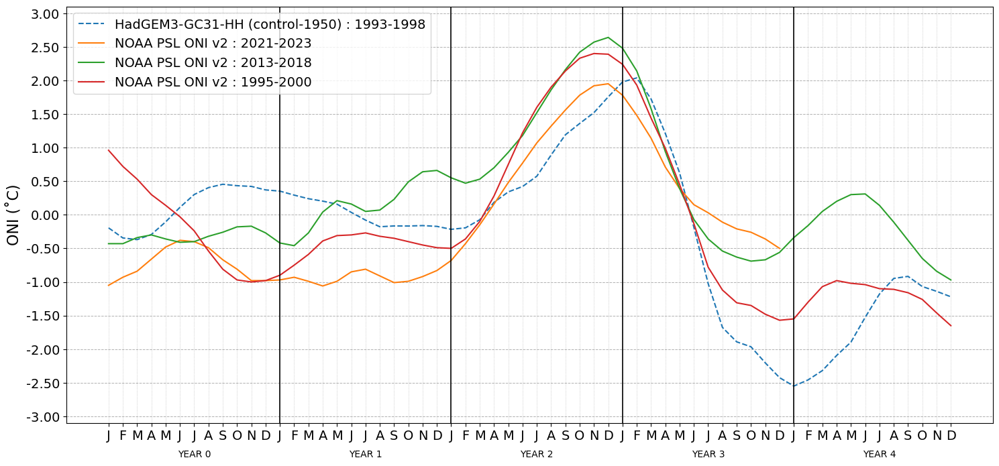

In [29]:
# =================================================================================================================
# PLOTTING FIGURE S2: Comparison of ONI time series across selected 5-year ENSO (or ENSO-like) cycles 
# from observations (NOAA PSL ONI v2) and the HadGEM3-GC31-HH control-1950 simulation. 
# The model period 1993-1998 (dashed blue) was selected as the closest analogue to the real-world 2013-2018 
# ENSO cycle (green) based on similarity in the amplitude, timing, and asymmetry of the El Niño and La Niña phases. 
# Observed cycles centred around the 1997-98, 2015-16 and 2023-2024 major El Niño events are also shown 
# (red and orange, respectively) for reference.
# =================================================================================================================

# Setting up x-axis tick labels and other variables.
months = ['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D']
n_years = 5 # Number of years to plot
total_months = n_years * 12
x = np.arange(total_months)
fig, ax = plt.subplots(figsize=(15, 7))
# Plotting timeseries for the selected ENSO cycles from the HG3 simulation and NOAA PSL ONI v2 observations.
ax.plot(np.arange(60), df['HadGEM3-GC31-HH_control']['1993':'1998'], label = 'HadGEM3-GC31-HH (control-1950) : 1993-1998', ls = '--')
ax.plot(np.arange(48), noaa_oni['2021':'2025']['ONI'].values, label = 'NOAA PSL ONI v2 : 2021-2023')
ax.plot(np.arange(60), noaa_oni['2013':'2017']['ONI'].values, label = 'NOAA PSL ONI v2 : 2013-2018')
ax.plot(np.arange(60), noaa_oni['1995':'1999']['ONI'].values, label = 'NOAA PSL ONI v2 : 1995-2000')

# Figure and axis formatting
ax.legend(fontsize = 14)
# Set month initials as x-axis labels
month_labels = [months[i % 12] for i in range(total_months)]
ax.set_xticks(ticks=x, labels=month_labels, fontsize = 14)
ax.set_yticks(ticks=np.arange(-3, 3.1, 0.5), labels=["{:.2f}".format(x) for x in np.arange(-3, 3.1, 0.5)], fontsize = 14)

# Grid lines for major x-axis ticks (year boundaries) and y-axis ticks
ax.xaxis.set_major_locator(FixedLocator(x))
ax.grid(True, which='major', axis='x', linestyle=':', linewidth=0.5)
# Add y-axis grid for context
ax.grid(True, which='major', axis='y', linestyle='--', linewidth=0.7)

# Draw thick, solid vertical lines for year boundaries
for year in range(1, n_years):
    plt.axvline(x=year * 12, color='black', linestyle='-', linewidth=1.2)
ax.set_ylabel('ONI (˚C)', fontsize = 16)

# Centered year labels under axis
year_positions = [i * 12 + 6 for i in range(n_years)]
year_labels = [f'YEAR {i}' for i in range(n_years)]
y_min = plt.ylim()[0]
for pos, label in zip(year_positions, year_labels):
    plt.text(pos, y_min - 0.5, label, ha='center', va='top')
plt.ylim([-3.1,3.1])
plt.tight_layout()
plt.show()

fig.savefig('./figures/figure_S2.png', bbox_inches='tight', dpi=300)

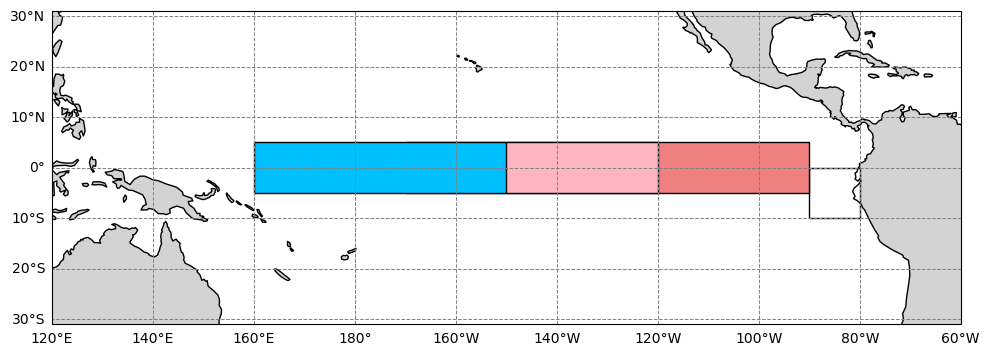

In [30]:
# ===============================================================================
# PLOTTING FIGURE S3: Niño monitoring regions in the tropical equatorial Pacific.
# ===============================================================================

# Niño regions with their bounds: (lon_min, lon_max, lat_min, lat_max)
nino_regions = {
    "Niño 1+2":  {"bounds": (-90, -80, -10, 0), "color": "white"},
    "Niño 3":    {"bounds": (-150, -90, -5, 5), "color": "lightcoral"},
    "Niño 3.4":  {"bounds": (-170, -120, -5, 5), "color": "lightpink"},
    "Niño 4":    {"bounds": (160, -150 + 360, -5, 5), "color": "deepskyblue"},  # wraparound
}

# Setup projection and figure
fig = plt.figure(figsize=(10, 4))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
ax.set_extent([120, 300, -31, 31], crs=ccrs.PlateCarree())

# Add land and coastlines
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.COASTLINE)

# Plot Niño regions
for props in nino_regions.values():
    lon_min, lon_max, lat_min, lat_max = props["bounds"]
    color = props["color"]
    # Handle dateline wraparound for Niño 4
    if lon_min > lon_max:
        ax.add_patch(Rectangle((lon_min, lat_min), 360 - lon_min, lat_max - lat_min,
                               facecolor=color, edgecolor='k', transform=ccrs.PlateCarree()))
        ax.add_patch(Rectangle((0, lat_min), lon_max, lat_max - lat_min,
                               facecolor=color, edgecolor='k', transform=ccrs.PlateCarree()))
    else:
        ax.add_patch(Rectangle((lon_min, lat_min), lon_max - lon_min, lat_max - lat_min,
                               facecolor=color, edgecolor='k', transform=ccrs.PlateCarree()))

# Add gridlines
gl = ax.gridlines(draw_labels=True, linewidth=0.7, color='gray', linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlocator = plt.MultipleLocator(20)
gl.ylocator = plt.MultipleLocator(10)

plt.tight_layout()
plt.show()

fig.savefig('./figures/figure_S3.png', bbox_inches='tight', dpi=300)

  0%|          | 0/12 [00:00<?, ?it/s]

100%|██████████| 12/12 [00:30<00:00,  2.53s/it]
/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:188: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'time' ('time',) The recommendation is to set join explicitly for this case.
  nb_ta = renamer(xr.merge(nb_ta, compat='no_conflicts'))
100%|██████████| 12/12 [00:21<00:00,  1.79s/it]
/dssgfs01/scratch/sg13n23/ATTRIBUTION_EXPS/NPD_Wind_Exp_Diagnostics/ENSO-WindPerturb-Thermocline/utils.py:188: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these

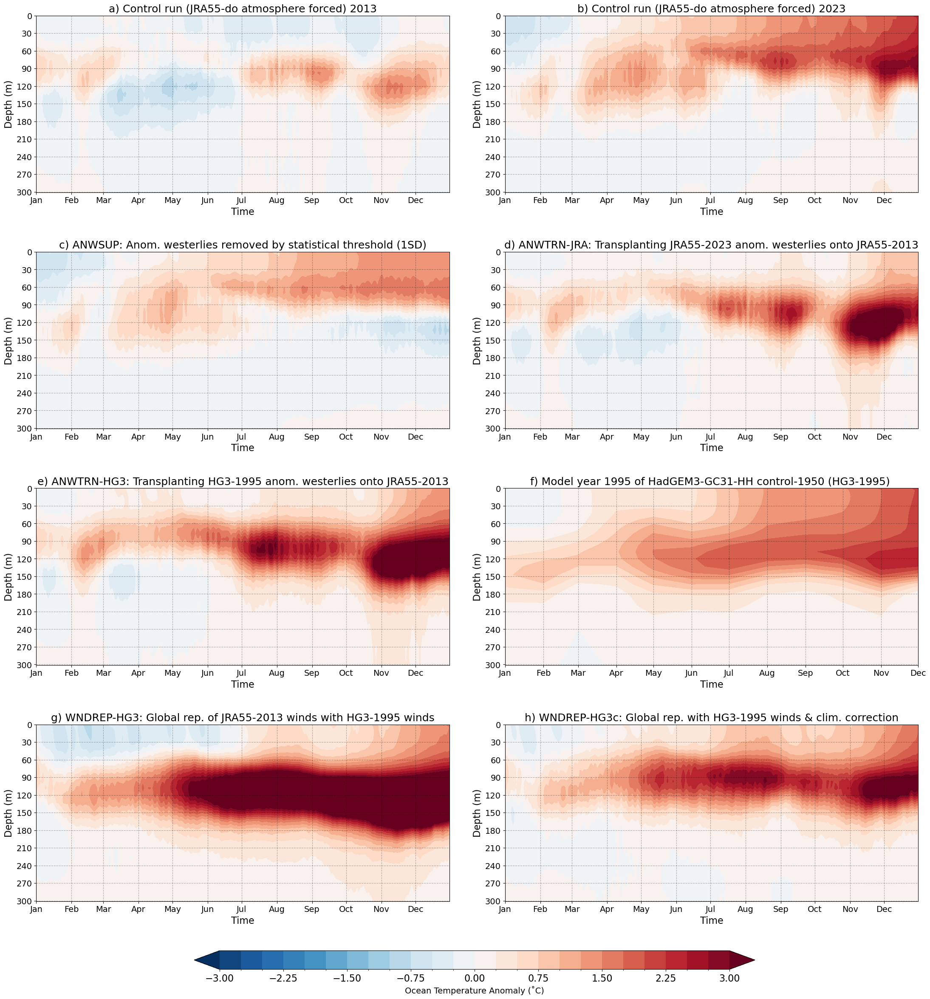

In [31]:
# ==================================================================================
# PLOTTING FIGURE S4: Subsurface evolutiion of temperature anomalies in the 
# Niño 3.4 region (depth vs. time) for experiments, control-equivalents and HG3-1995
# ==================================================================================

# Figure titles setup
fig_titles = {'CTRL_2013' : 'a) Control run (JRA55-do atmosphere forced) 2013',
              'CTRL_2023' : 'b) Control run (JRA55-do atmosphere forced) 2023',
              'ANWSUP' : 'c) ANWSUP: Anom. westerlies removed by statistical threshold (1SD)',
              'ANWTRN-JRA' : 'd) ANWTRN-JRA: Transplanting JRA55-2023 anom. westerlies onto JRA55-2013',
              'ANWTRN-HG3' : 'e) ANWTRN-HG3: Transplanting HG3-1995 anom. westerlies onto JRA55-2013',
              'HG3-1995' : 'f) Model year 1995 of HadGEM3-GC31-HH control-1950 (HG3-1995) ',
              'WNDREP-HG3' : 'g) WNDREP-HG3: Global rep. of JRA55-2013 winds with HG3-1995 winds',
              'WNDREP-HG3c' : 'h) WNDREP-HG3c: Global rep. with HG3-1995 winds & clim. correction'}
             
# Creating figures and axes
fig, axes = plt.subplots(4,2, figsize = (22,22))
axes = axes.flatten()

# Looping through each item in fig_titles (i.e., experiment/control/HG3-1995)
for ax, title_key in zip(axes, fig_titles.keys()):    
    # This nino_ta_calc function is defined in utils.py and calculates the Niño 3.4 temperature anomaly for a given experiment/control/HG3-1995
    n34_ta = nino_ta_calc(nb = 'N34', exp = title_key, freq = '1d')
    if 'HG3-' in title_key:
        n34_ta['time'] = pd.to_datetime(['{}-{:02d}-01'.format(pd.to_datetime(x).year, pd.to_datetime(x).month) for x in n34_ta['time'].values])
        
    c = n34_ta['toce_con'].mean(dim = ['y', 'x']).sel(depth = slice(0,310)).plot.contourf(x = 'time', y = 'depth', yincrease = False, 
                                                                                          levels = np.arange(-3, 3.1, 0.25),
                                                                                          cmap = 'RdBu_r', add_colorbar = False, extend = 'both', ax = ax)

    # Axes formatting
    ax.set_title(fig_titles[title_key], fontsize = 18)
    ax.set_xticks(ticks = [x.values for x in n34_ta['time'] if x.dt.day == 1], 
                  labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    ax.set_yticks(ticks = np.arange(0,300.1,30))
    ax.grid(True, alpha = 0.3, ls = '--', color = 'k')
    ax.tick_params(axis='both', labelsize=14)
    ax.set_xlabel('Time', fontsize = 16)
    ax.set_ylabel('Depth (m)', fontsize = 16)

# Common colorbar setup for the entire figure
cbar_ax = fig.add_axes([0.21, -0.04, 0.6, 0.02])
cbar=fig.colorbar(c, cax=cbar_ax, orientation='horizontal')
cbar.set_label(label= "Ocean Temperature Anomaly (˚C)", size = 14)
cbar.ax.tick_params(labelsize=16)
fig.tight_layout(h_pad=4, w_pad=4)
fig.savefig('./figures/figure_S4.png', bbox_inches='tight', dpi=300)